In [1]:
#import sys
#sys.path.append("..\\..")

from src.helpers.plotters import *
import pandas as pd
from ipywidgets import widgets, interact

ModuleNotFoundError: No module named 'ipywidgets'

In [8]:
df = pd.read_csv('cleaned/output_ebay_full_cleaned.csv')
df_dropped = pd.read_csv('cleaned/output_ebay_dropped.csv')
df_encoded = pd.read_csv('cleaned/output_ebay_encoded.csv')


df.head()

,condition,country,model,sale_date,title,price_pln,producer,model_group,handheld,home_console,generation,seller_name,seller_num_comments,seller_rating,region,condition_num,seller_score,collectible
0,Używany,Stany Zjednoczone,Xbox,2024-12-29,Oryginalny pakiet konsoli Microsoft Xbox z kon...,327.48,Microsoft,Xbox,0,1,6,galvearman.hqncmg46,1078,99.9,AM,1,0.736873,0
1,Używany,Stany Zjednoczone,Xbox,2024-12-29,Oryginalna konsola Microsoft OG Xbox tylko prz...,286.38,Microsoft,Xbox,0,1,6,burrows.anton19,280,100.0,AM,1,0.692709,0
2,Używany,Stany Zjednoczone,Xbox,2024-12-29,Oryginalny pakiet konsoli Microsoft Xbox z gra...,511.71,Microsoft,Xbox,0,1,6,midori.market,107,100.0,AM,1,0.660797,0
3,Używany,Stany Zjednoczone,Xbox,2024-12-29,Oryginalny pakiet konsoli XBOX: (2) kontrolery...,532.18,Microsoft,Xbox,0,1,6,chadmassie,108,100.0,AM,1,0.661105,0
4,Używany,Stany Zjednoczone,Xbox,2024-12-29,Konsola Microsoft Xbox 8GB - czarna (Scarface ...,286.58,Microsoft,Xbox,0,1,6,eg.sixoneseven,67,100.0,AM,1,0.645358,0


In [7]:
df["producer"].unique()

array(['Microsoft', 'Nintendo', 'Sony', 'Valve'], dtype=object)

In [8]:
df["model"].unique()

array(['Xbox', 'Xbox 360', 'Xbox 360 Arcade', 'Xbox 360 Core',
       'Xbox 360 E', 'Xbox 360 Elite', 'Xbox 360 Premium', 'Xbox 360 Pro',
       'Xbox 360 S', 'Xbox One', 'Xbox One S', 'Xbox One X',
       'Xbox Series S', 'Xbox Series X', 'New 2DS XL', 'New 3DS',
       'New 3DS LL', 'New 3DS XL', '2DS', '2DS LL', '3DS', '3DS XL', '64',
       'DS', 'DSi', 'DSi XL', 'DS Lite', 'Game Boy', 'Game Boy Advance',
       'Game Boy Advance SP', 'Game Boy Color', 'Game Boy Light',
       'Game Boy Micro', 'Game Boy Pocket', 'GameCube', 'NES',
       'NES Classic Edition', 'SNES', 'Super NES Classic Edition',
       'Switch', 'Switch (OLED Model)', 'Switch Lite', 'Wii', 'Wii mini',
       'Wii U - Basic', 'Wii U - Deluxe', 'PlayStation 1',
       'PlayStation 2', 'PlayStation 2 - Slim', 'PlayStation 3',
       'PlayStation 3 - Slim', 'PlayStation 3 - Super Slim',
       'PlayStation 4', 'PlayStation 4 Pro', 'PlayStation 4 Slim',
       'PlayStation 5 Blu-Ray Edition', 'PlayStation 5 Digital Ed

In [9]:
model_count = df["producer"].value_counts().reset_index()
model_count.head()

,producer,count
0,Nintendo,96465
1,Sony,55300
2,Microsoft,29821
3,Valve,1797


In [10]:
plotly_pie(model_count, values="count", names="producer", title="Producers")

In [11]:
price = df[["producer","price_pln"]]
price.head()

,producer,price_pln
0,Microsoft,327.48
1,Microsoft,286.38
2,Microsoft,511.71
3,Microsoft,532.18
4,Microsoft,286.58


In [12]:
price_stats = df.groupby("producer")["price_pln"].agg(["mean", "min", "max"]).reset_index()
price_stats.head()

,producer,mean,min,max
0,Microsoft,403.332306,0.50,999.35
1,Nintendo,389.043990,0.05,999.06
2,Sony,412.877408,0.05,998.99
3,Valve,436.467858,4.14,993.84


In [13]:
plotly_bar(price_stats, x_axis="producer",y_axis="min",title="Smallest prices", x_axis_title="Producers", y_axis_title="Price [PLN]")

In [14]:
plotly_bar(price_stats, "producer", "mean", title='Mean price', x_axis_title="Producers", y_axis_title="Price [PLN]")

In [15]:
plotly_bar(price_stats, x_axis="producer", y_axis="max", title="Biggest prices", x_axis_title="Producers", y_axis_title="Price [PLN]")

In [16]:
condition_values = df["condition"].value_counts().reset_index()
condition_values.head()

,condition,count
0,Używany,138476
1,Tylko na części,23366
2,Fabrycznie nowy,12433
3,Nowy (inny),5093
4,Odnowiony,4015


In [17]:
plotly_pie(condition_values, values="count", names="condition", title="Conditions")

<Axes: xlabel='price_pln', ylabel='Count'>

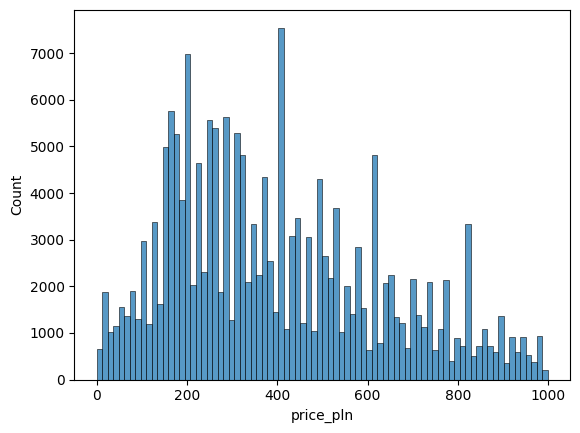

In [18]:
import seaborn as sns
sns.histplot(df['price_pln'])

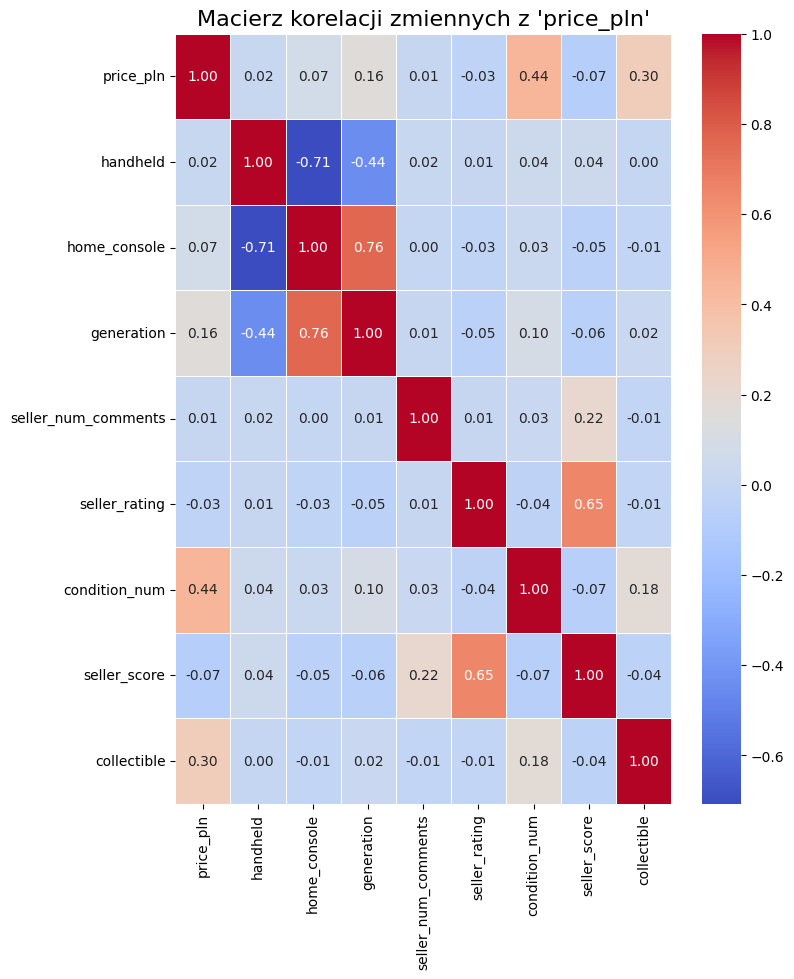

In [43]:
plot_corr_matrix(df_dropped)

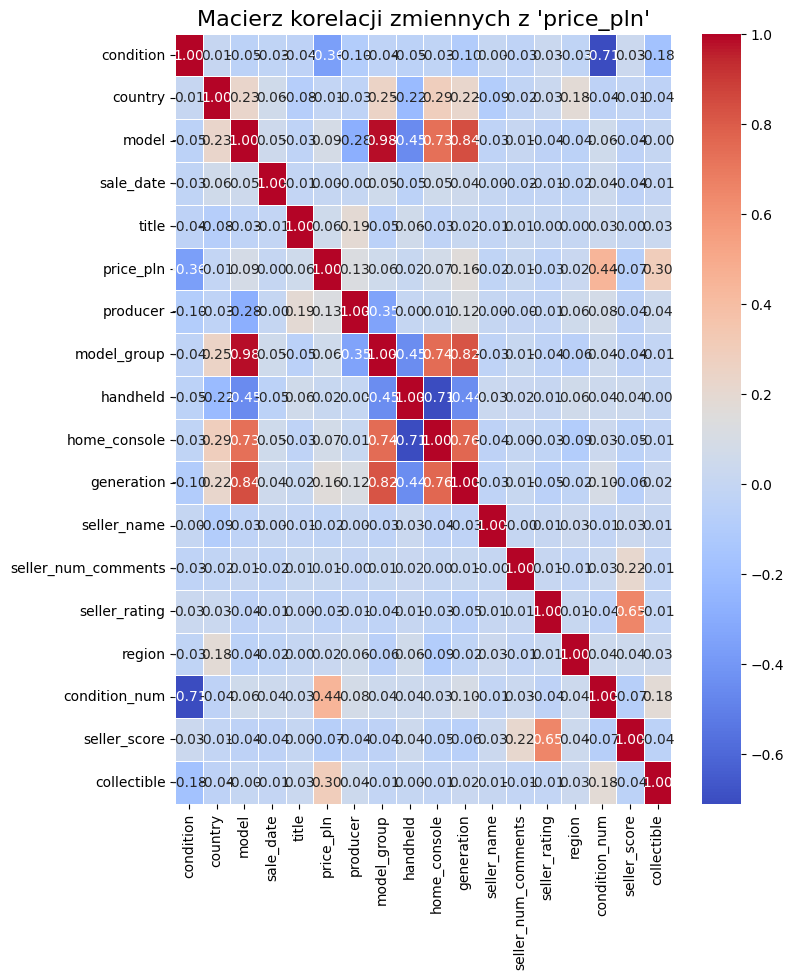

In [44]:
plot_corr_matrix(df_encoded, fig_width=10, fig_height=12)

In [53]:
def get_model_groups(producer):
    if producer == 'All':
        return ['All'] + list(df['model_group'].unique())
    else:
        return ['All'] + list(df[df['producer'] == producer]['model_group'].unique())

producer_dropdown = widgets.Dropdown(options=['All'] + list(df['producer'].unique()), description='Producer:')
model_group_dropdown = widgets.Dropdown(options=get_model_groups('All'), description='Model Group:')
arg_dropdown = widgets.Dropdown(options=['collectible', 'condition', 'region'], description='Select Argument:')

def update_model_group_options(*args):
    model_group_dropdown.options = get_model_groups(producer_dropdown.value)

producer_dropdown.observe(update_model_group_options, 'value')

interact(create_box_plot,
         selected_producer=producer_dropdown,
         selected_model_group=model_group_dropdown,
         selected_arg=arg_dropdown)

interactive(children=(Dropdown(description='Producer:', options=('All', 'Microsoft', 'Nintendo', 'Sony', 'Valv…

<function __main__.create_box_plot(selected_producer='All', selected_model_group='All', selected_arg='collectible')>

In [54]:
def get_model_groups(producer):
    if producer == 'All':
        return ['All'] + list(df['model_group'].unique())
    else:
        return ['All'] + list(df[df['producer'] == producer]['model_group'].unique())

producer_dropdown = widgets.Dropdown(options=['All'] + list(df['producer'].unique()), description='Producer:')
model_group_dropdown = widgets.Dropdown(options=get_model_groups('All'), description='Model Group:')
arg_dropdown = widgets.Dropdown(options=['collectible', 'condition', 'region'], description='Select Argument:')

def update_model_group_options(*args):
    model_group_dropdown.options = get_model_groups(producer_dropdown.value)

producer_dropdown.observe(update_model_group_options, 'value')

interact(create_pie_chart,
         selected_producer=producer_dropdown,
         selected_model_group=model_group_dropdown,
         selected_arg=arg_dropdown)

interactive(children=(Dropdown(description='Producer:', options=('All', 'Microsoft', 'Nintendo', 'Sony', 'Valv…

<function __main__.create_pie_chart(selected_producer='All', selected_model_group='All', selected_arg='collectible')>

In [55]:
def get_model_groups(producer):
    if producer == 'All':
        return ['All'] + list(df['model_group'].unique())
    else:
        return ['All'] + list(df[df['producer'] == producer]['model_group'].unique())

producer_dropdown = widgets.Dropdown(options=['All'] + list(df['producer'].unique()), description='Producer:')
model_group_dropdown = widgets.Dropdown(options=get_model_groups('All'), description='Model Group:')
arg_dropdown = widgets.Dropdown(options=['None', 'collectible', 'condition', 'region'], description='Argument:')
val_dropdown = widgets.Dropdown(options=['None'], description='Value:')

def update_value_options(*args):
    selected_category = arg_dropdown.value
    if selected_category != 'None':
        val_dropdown.options = ['None'] + list(df[selected_category].unique())
    else:
        val_dropdown.options = ['None']

arg_dropdown.observe(update_value_options, 'value')

def update_model_group_options(*args):
    model_group_dropdown.options = get_model_groups(producer_dropdown.value)

producer_dropdown.observe(update_model_group_options, 'value')

interact(create_histogram,
         selected_producer=producer_dropdown,
         selected_model_group=model_group_dropdown,
         selected_arg=arg_dropdown,
         selected_val=val_dropdown)

interactive(children=(Dropdown(description='Producer:', options=('All', 'Microsoft', 'Nintendo', 'Sony', 'Valv…

<function __main__.create_histogram(selected_producer='All', selected_model_group='All', selected_arg='None', selected_val='None')>

In [56]:
arg_dropdown = widgets.Dropdown(
    options=['seller_score', 'seller_num_comments', 'seller_rating'],
    description='Y-axis:'
)

interact(create_scatter_plot,
    selected_arg=arg_dropdown)

interactive(children=(Dropdown(description='Y-axis:', options=('seller_score', 'seller_num_comments', 'seller_…

<function __main__.create_scatter_plot(selected_arg='seller_score')>